# Medical Image Denoising Using Generative Adversarial Netowrk

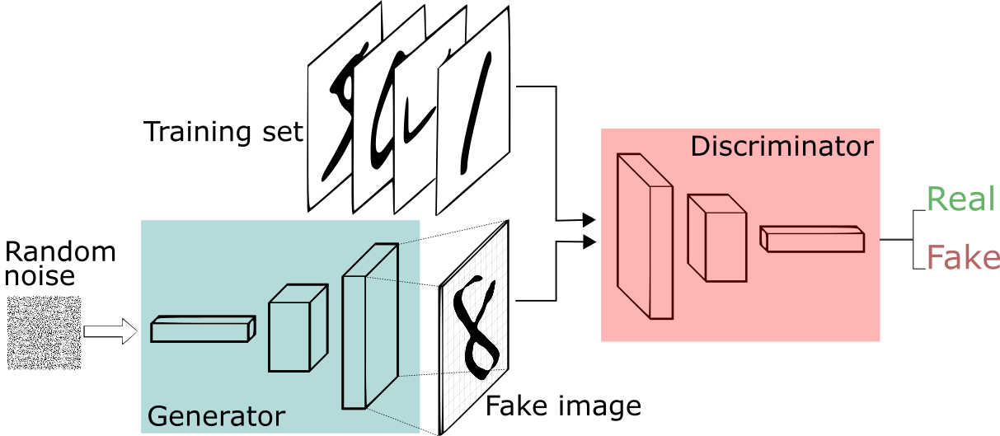

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 529 kB 7.6 MB/s 


In [ ]:
!pip install torchsummary

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import torch 
torch.manual_seed(42)
import numpy as np 
import matplotlib.pyplot as plt 
from google.colab import files
import pandas as pd
import matplotlib.pyplot as plt
# Import the Images module from pillow

from PIL import Image
import numpy as np
import skimage
import os
from tqdm.notebook import tqdm

from torch import nn
from torchsummary import summary
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
from torchvision import transforms 
from torch.nn.modules.activation import LeakyReLU
from torchvision.transforms import InterpolationMode

from torchmetrics import PeakSignalNoiseRatio
from torchmetrics import StructuralSimilarityIndexMeasure
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Configurations

In [ ]:
# device = 'cuda' # used to transer images to device --> image = image.to(device)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

batch_size = 10

# opt parmas
lr = 0.0002 
beta_1 = 0.5
beta_2 = 0.99

#train vars
epochs = 50

size = 128, 128
img_dir = '/content/drive/MyDrive/Denoising_GANs/data/'
im1 = Image.open('/content/drive/MyDrive/Denoising_GANs/data/00000001_000.png')


In [ ]:
def reduce_size(image):
  im_resized = image.resize(size, Image.LANCZOS)
  return np.array(im_resized).reshape(1,*size)/255

In [ ]:
import numpy as np
import os
import cv2
def noisy(noise_typ,image):
  if noise_typ == "gauss":
      row,col,ch= image.shape
      mean = 0
      var = 0.1
      sigma = var**1.5
      gauss = np.random.normal(mean,sigma,(row,col,ch))
      gauss = gauss.reshape(row,col,ch)
      noisy = image + gauss
      return noisy
  elif noise_typ == "poisson":
      vals = len(np.unique(image))
      vals = 2 ** np.ceil(np.log2(vals))
      noisy = np.random.poisson(image * vals) / float(vals)
      return noisy
  elif noise_typ =="speckle":
      row,col,ch = image.shape
      gauss = np.random.randn(row,col,ch)
      gauss = gauss.reshape(row,col,ch)        
      noisy = image + image * gauss/10
      return noisy

In [ ]:
import random
im1 = Image.open('/content/drive/MyDrive/Denoising_GANs/data/00000001_000.png')
im1 = reduce_size(im1)
im1.min(   )
noi = ["poisson"]
random_noise = random.choice(noi)
print(random_noise)
im1 = noisy(random_noise, im1)

poisson


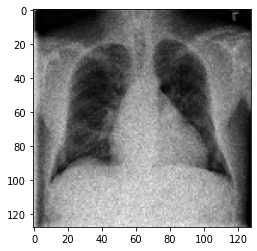

In [ ]:
plt.imshow(im1[0], cmap="gray")

In [ ]:
def create_training_data(img_dir):
  real_images = []
  noisy_images = []
  for f in tqdm(os.listdir(img_dir)):
    if os.path.splitext(f)[1] not in ['.png', '.jpg', '.jpeg']:
      continue
    image = Image.open(img_dir + str(f))
    image = reduce_size(image)
    if len(image.shape)>3:
      continue
    real_images.append(image)
    noi = ["poisson"]
    random_noise = random.choice(noi)
    noisy_image = noisy(random_noise,image)
    #  = image + 0.05 * np.random.randn(*image.shape)
    noisy_images.append(noisy_image)
  return torch.tensor(real_images).double(), torch.tensor(noisy_images).double()


In [ ]:
real_images, noisy_images = create_training_data(img_dir)

  0%|          | 0/200 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at  ../torch/csrc/utils/tensor_new.cpp:201.)


In [ ]:
# Stacking the real and noisy images
a = torch.stack((real_images,noisy_images), axis=1)
a.shape

torch.Size([200, 2, 1, 128, 128])

# Load Dataset Into Batches 

In [ ]:
# Loading Real Images
real_image_loader = DataLoader(real_images, batch_size=batch_size, shuffle = True)

In [ ]:
# Loading the stacked Images
a_loader = DataLoader(a, batch_size=batch_size, shuffle = True)

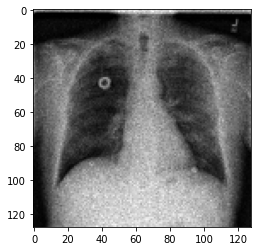

In [ ]:
# Printing noisy image
plt.imshow(noisy_images[0][0], cmap="gray")

In [ ]:
# Loading noisy Images
noisy_image_loader = DataLoader(noisy_images, batch_size=batch_size, shuffle = True)

In [ ]:
# Creating Batches of real and noisy Images
# Batch0 is Real Image
# Batch1 is fake Image

dataiter = iter(a_loader)

batch = dataiter.next()

batch0 = batch[:,0].to(device)
batch1 = batch[:,1].to(device)

In [ ]:
# Checking batch size
batch0.shape

torch.Size([10, 1, 128, 128])

In [ ]:
# This function used to plot some of images from the batch

def show_tensor_images(tensor_img, num_images = 9, size=(1, 128, 128)):
    unflat_img = tensor_img.detach().cpu()
    img_grid = make_grid(unflat_img[:num_images], nrow=3)
    plt.figure(figsize=(10,10))
    plt.imshow(img_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [ ]:
# Functions defining Evaluation Metrics

def calculate_batch_psnr(fake_image,real_image):
    psnr = PeakSignalNoiseRatio().to(device)
    p = psnr(fake_image, real_image)
    return p

def calculate_batch_ssim(fake_image, real_image):
    ssim = StructuralSimilarityIndexMeasure().to(device)
    s = ssim(fake_image, real_image)
    return s

In [ ]:
# Testing PSNR
ps = calculate_batch_psnr(batch1, batch0)
ps

tensor(26.9565, device='cuda:0', dtype=torch.float64)

In [ ]:
# Testing SSIM
ss = calculate_batch_ssim(batch1, batch0)
ss

tensor(0.5421, device='cuda:0')

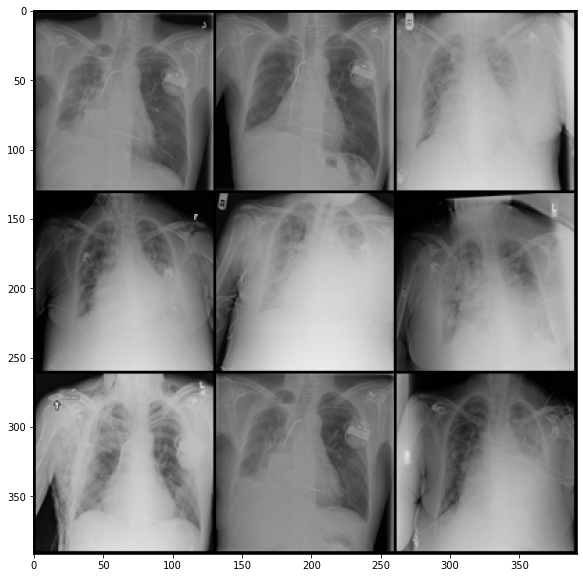

In [ ]:
# Plotting Real Images
show_tensor_images(batch0)

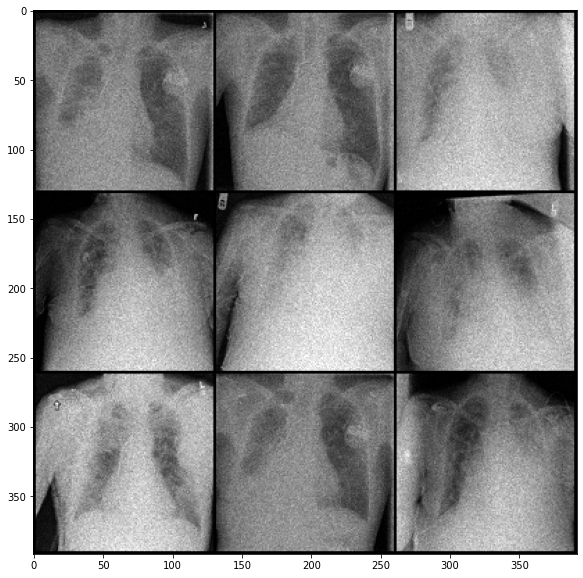

In [ ]:
# PLotting Noisy Images
show_tensor_images(batch1)

# Create Discriminator Network 

In [ ]:
# Defining the Discriminator Block

def get_disc_block(in_channels, out_channels, kernel_size, stride, padding=0):
  model = nn.Sequential(
      # Convolution Layer
      nn.Conv2d( in_channels = in_channels, out_channels = out_channels, kernel_size = kernel_size, stride = stride, padding=padding),
      # Batch Normalization
      nn.BatchNorm2d(out_channels),
      # LeakyReLU activation function
      nn.LeakyReLU()
  )
  return model

In [ ]:
# Defining the class for Discriminator Model

class Discriminator(nn.Module):

  def __init__(self):
    super(Discriminator, self).__init__()

    self.initial = get_disc_block(1,16,(3,3),2)
    self.block1 = get_disc_block(1,16,(3,3),2)
    self.block2 = get_disc_block(16,32,(5,5),2)
    self.block3 = get_disc_block(32,64,(5,5),2)
    self.block4 = get_disc_block(64,128,(5,5),2)
    self.block5 = get_disc_block(128,256,(5,5),2)
    self.flatten = nn.Flatten()
    self.linear = nn.Linear(in_features=256, out_features=1)
    self.sigmoid = nn.Sigmoid()

  def forward(self, images):
    output = self.initial(images)
    output = self.block2(output)
    output = self.block3(output)
    output = self.block4(output)
    output = self.block5(output)
    output = self.linear(self.flatten(output))
    # Sigmoid Activation at Last to classify between real and fake
    output = self.sigmoid(output)
    return output

In [ ]:
# Defining the instance of the model
D = Discriminator()
D.to(device)

Discriminator(
  (initial): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, m

In [ ]:
# Checking the summary of the model
summary(D, input_size=(1,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 63, 63]             160
       BatchNorm2d-2           [-1, 16, 63, 63]              32
         LeakyReLU-3           [-1, 16, 63, 63]               0
            Conv2d-4           [-1, 32, 30, 30]          12,832
       BatchNorm2d-5           [-1, 32, 30, 30]              64
         LeakyReLU-6           [-1, 32, 30, 30]               0
            Conv2d-7           [-1, 64, 13, 13]          51,264
       BatchNorm2d-8           [-1, 64, 13, 13]             128
         LeakyReLU-9           [-1, 64, 13, 13]               0
           Conv2d-10            [-1, 128, 5, 5]         204,928
      BatchNorm2d-11            [-1, 128, 5, 5]             256
        LeakyReLU-12            [-1, 128, 5, 5]               0
           Conv2d-13            [-1, 256, 1, 1]         819,456
      BatchNorm2d-14            [-1, 25

In [ ]:
D.double()

Discriminator(
  (initial): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2))
    (1): BatchNorm2d(128, eps=1e-05, m

# Create Generator Network 

In [ ]:
# Defining the Generator Block
def get_gen_blockConv(in_channels, out_channels, kernel_size, stride, padding=0):
  model = nn.Sequential(
      # Convolution Layer
      nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
      # Batch Normalization
      nn.BatchNorm2d(out_channels),
      # PReLU Activation function
      nn.PReLU()
  )
  return model

In [ ]:
# Defining the class of Generator Model

class Generator(nn.Module):

  def __init__(self):
    super(Generator, self).__init__()

    self.block1 = get_gen_blockConv(1, 16, (9,9), 1, padding='same')
    self.block2 = get_gen_blockConv(16, 32, (3,3), 1, padding='same')
    self.block3 = get_gen_blockConv(32, 64, (3,3), 1, padding='same')
    self.block4 = get_gen_blockConv(64, 128, (3,3), 1, padding='same')
    self.blockResConv = get_gen_blockConv(128, 128, (3,3), 1, padding='same')
    self.block5= get_gen_blockConv(128, 64, (3,3), 1, padding='same' )
    self.block6 = get_gen_blockConv(64, 32, (3,3), 1, padding='same' )
    self.block7 = get_gen_blockConv(32, 16, (3,3), 1, padding='same' )
    self.lastconv = get_gen_blockConv(16, 1, (9,9), 1, padding='same' )
    self.tanh = nn.Tanh()
    self.prelu = nn.PReLU()

  def resnet_forward(self, input):
    output = self.blockResConv(input)

    output = output + input
    output = self.prelu(output)
    return output

  def forward(self,noisy_image):
    # Down sampling
    conv1 = self.block1(noisy_image)
    conv2 = self.block2(conv1)
    conv3 = self.block3(conv2)
    conv4 = self.block4(conv3)

    # ResNet Function
    res1 = self.resnet_forward(conv4)
    res2 = self.resnet_forward(res1)
    res3 = self.resnet_forward(res2)

    # Up sampling
    T0 = transforms.Resize((32, 32), InterpolationMode.NEAREST)
    deconv0 = self.block5(T0(res3))
    T1 = transforms.Resize((64, 64), InterpolationMode.NEAREST)
    deconv1 = self.block6(T1(deconv0))
    T2 = transforms.Resize((128, 128), InterpolationMode.NEAREST)
    deconv2 = self.block7(T2(deconv1))
    deconv2 = deconv2 + conv1
    conv5 = self.lastconv(deconv2)
    conv5= self.tanh(conv5)
    output = conv5 + noisy_image

    return output

In [ ]:
# Defining the instance of Generator
G = Generator()
G.to(device)

Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
summary(G, input_size=(1,128,128) )

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 128, 128]           1,312
       BatchNorm2d-2         [-1, 16, 128, 128]              32
             PReLU-3         [-1, 16, 128, 128]               1
            Conv2d-4         [-1, 32, 128, 128]           4,640
       BatchNorm2d-5         [-1, 32, 128, 128]              64
             PReLU-6         [-1, 32, 128, 128]               1
            Conv2d-7         [-1, 64, 128, 128]          18,496
       BatchNorm2d-8         [-1, 64, 128, 128]             128
             PReLU-9         [-1, 64, 128, 128]               1
           Conv2d-10        [-1, 128, 128, 128]          73,856
      BatchNorm2d-11        [-1, 128, 128, 128]             256
            PReLU-12        [-1, 128, 128, 128]               1
           Conv2d-13        [-1, 128, 128, 128]         147,584
      BatchNorm2d-14        [-1, 128, 1

In [ ]:
G.double()

Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
# Replace Random initialized weights to Normal weights  

def weights_init(m):  
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        nn.init.normal_(m.weight, -0.01, 0.01)
    if isinstance(m, nn.BatchNorm2d):
        nn.init.normal_(m.weight, -0.01, 0.01)
        nn.init.constant_(m.bias, 0)

In [ ]:
# Applying weigths
D = D.apply(weights_init)
G = G.apply(weights_init)

In [ ]:
g_out = G(batch1)

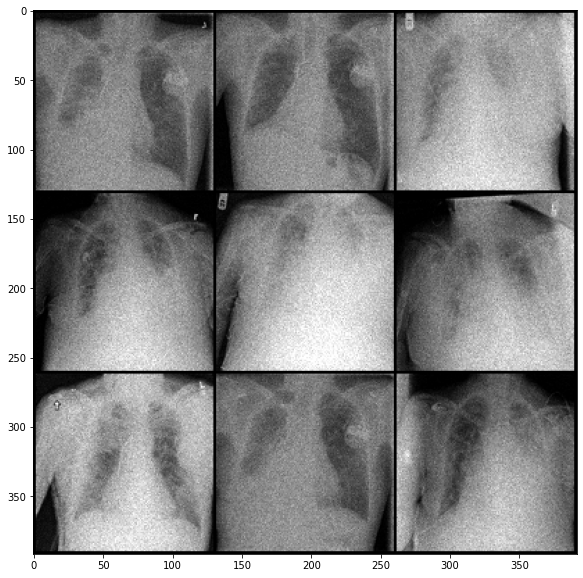

In [ ]:
show_tensor_images(g_out)

# Create Loss Function and Load Optimizer

In [ ]:
# Defining the loss

def real_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  y_true = torch.ones_like(disc_pred)
  loss = criterion(disc_pred, y_true)
  return loss

def fake_loss(disc_pred):
  criterion = nn.BCEWithLogitsLoss()
  y_true = torch.zeros_like(disc_pred)
  loss = criterion(disc_pred, y_true)
  return loss

def pixel_loss(true_img, gen_img):
    l2_loss = nn.MSELoss(reduction = 'sum')
    return l2_loss(true_img, gen_img)


In [ ]:
# Defining the Adam optimizer
D_opt = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta_1, beta_2))
G_opt = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta_1, beta_2))

In [ ]:
# Initializing loss
loss = nn.BCEWithLogitsLoss()
input = torch.randn(3, requires_grad=True)
target = torch.empty(3).random_(2)
output = loss(input, target)
output.backward()

In [ ]:
output

tensor(0.5854, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>)

# Training Loop 

In [ ]:
# Defining List of items to be stored

iter=[]
psnr=[]
dloss=[]
gloss=[]
ssim = []

iter_psnr = pd.DataFrame(columns=["Iterations", "PSNR", "SSIM","D_Loss", "G_Loss"])

Epoch Number: 1


  0%|          | 0/20 [00:00<?, ?it/s]

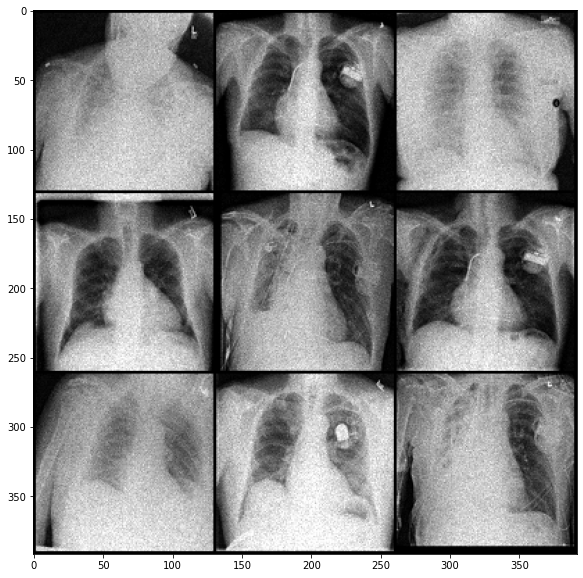

avg_d_loss 0.7224600918592338
avg_g_loss 3.938472419833052
PSNR:  26.78868744448664
SSIM:  0.6319417357444763
Epoch Number: 2


  0%|          | 0/20 [00:00<?, ?it/s]

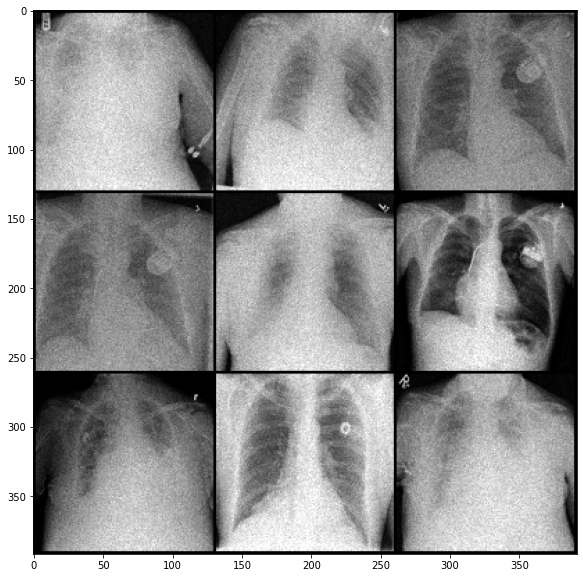

avg_d_loss 0.7211802433700307
avg_g_loss 3.7438463510864763
PSNR:  26.95337502756178
SSIM:  0.5770152807235718
Epoch Number: 3


  0%|          | 0/20 [00:00<?, ?it/s]

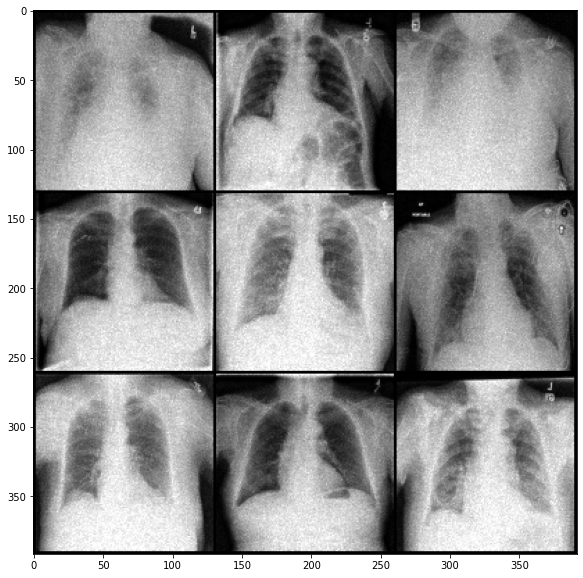

avg_d_loss 0.7197688999854569
avg_g_loss 3.0888833846846313
PSNR:  28.08843220935387
SSIM:  0.685039222240448
Epoch Number: 4


  0%|          | 0/20 [00:00<?, ?it/s]

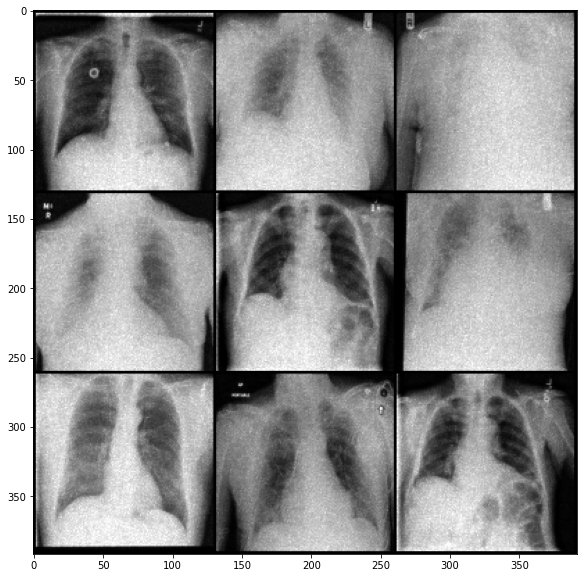

avg_d_loss 0.718120936869277
avg_g_loss 2.675624972027397
PSNR:  28.985126253101043
SSIM:  0.7212466597557068
Epoch Number: 5


  0%|          | 0/20 [00:00<?, ?it/s]

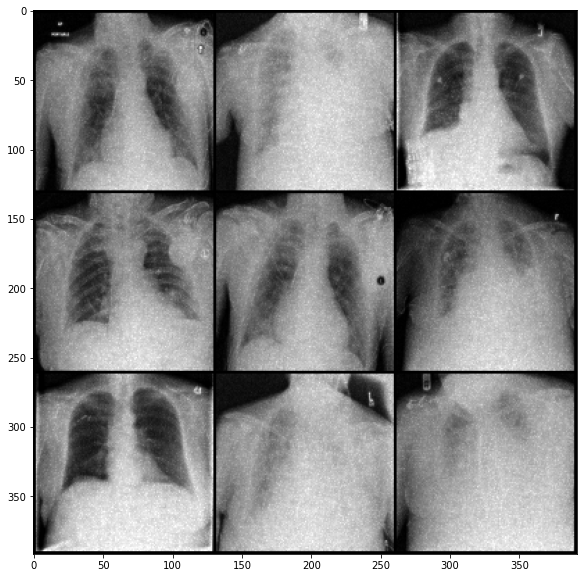

avg_d_loss 0.7163400267665623
avg_g_loss 2.457803768246817
PSNR:  29.680978325820888
SSIM:  0.7261532545089722
Epoch Number: 6


  0%|          | 0/20 [00:00<?, ?it/s]

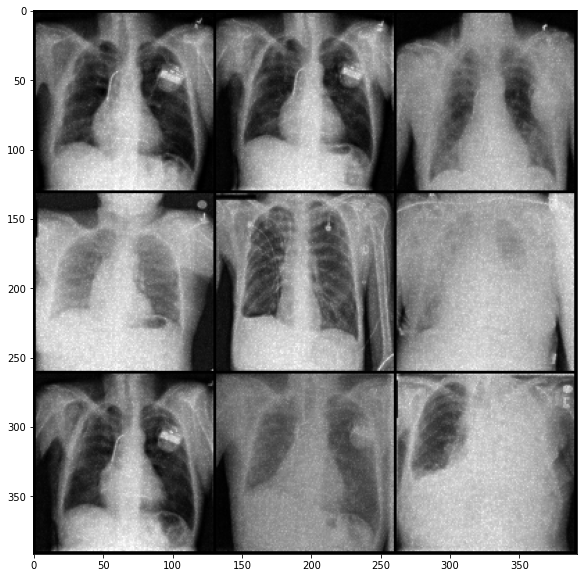

avg_d_loss 0.7145002758711398
avg_g_loss 2.306890038357972
PSNR:  29.912040405196663
SSIM:  0.7741812467575073
Epoch Number: 7


  0%|          | 0/20 [00:00<?, ?it/s]

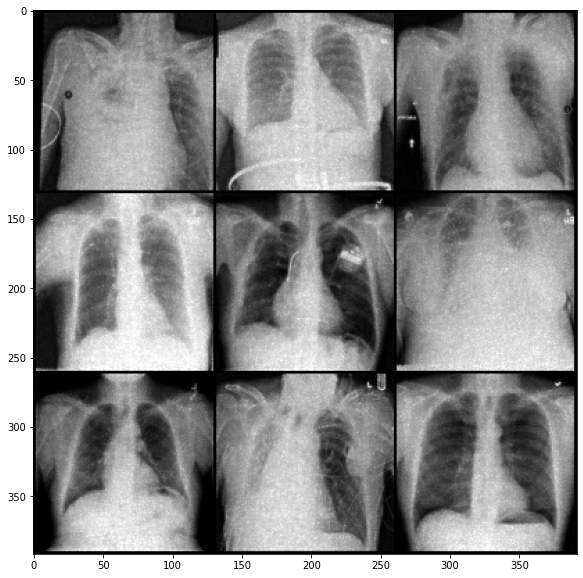

avg_d_loss 0.7125503316201145
avg_g_loss 2.1875677105285667
PSNR:  30.18538399814929
SSIM:  0.8003263473510742
Epoch Number: 8


  0%|          | 0/20 [00:00<?, ?it/s]

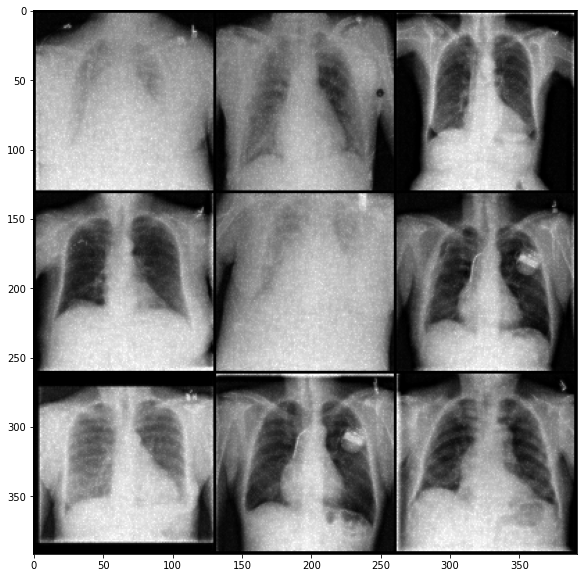

avg_d_loss 0.7106242396023823
avg_g_loss 2.0890431082749332
PSNR:  30.654570259015372
SSIM:  0.8197520971298218
Epoch Number: 9


  0%|          | 0/20 [00:00<?, ?it/s]

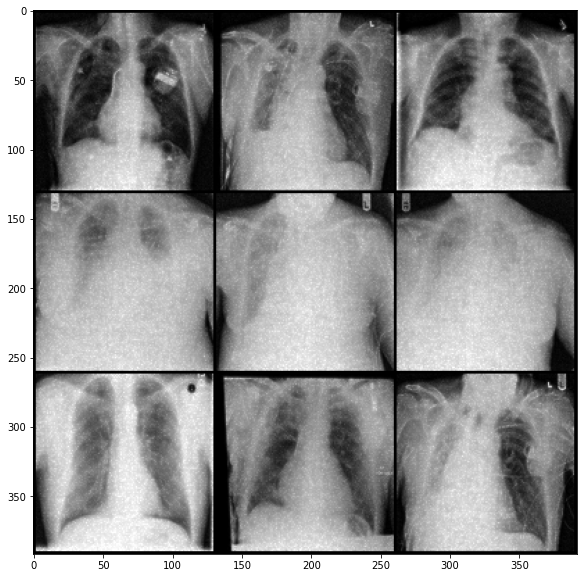

avg_d_loss 0.7090097003171809
avg_g_loss 2.0943465270779145
PSNR:  30.064683970615707
SSIM:  0.7657851576805115
Epoch Number: 10


  0%|          | 0/20 [00:00<?, ?it/s]

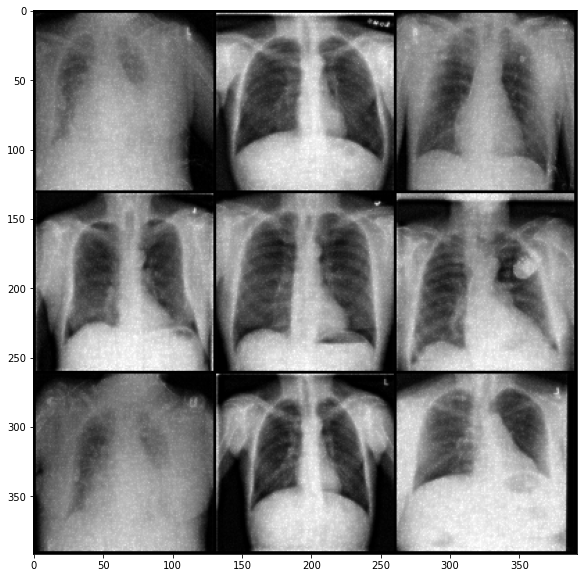

avg_d_loss 0.7071967300879362
avg_g_loss 1.9564042432549988
PSNR:  31.188564627232154
SSIM:  0.8358708620071411
Epoch Number: 11


  0%|          | 0/20 [00:00<?, ?it/s]

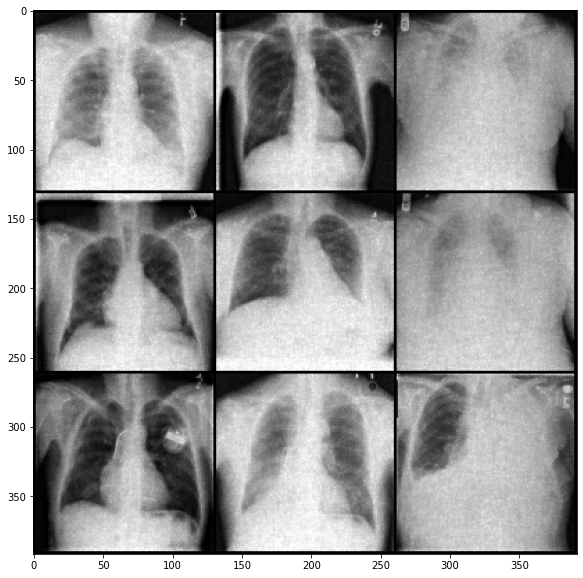

avg_d_loss 0.7055756084945615
avg_g_loss 1.8844489746119273
PSNR:  30.50127855855459
SSIM:  0.7828088998794556
Epoch Number: 12


  0%|          | 0/20 [00:00<?, ?it/s]

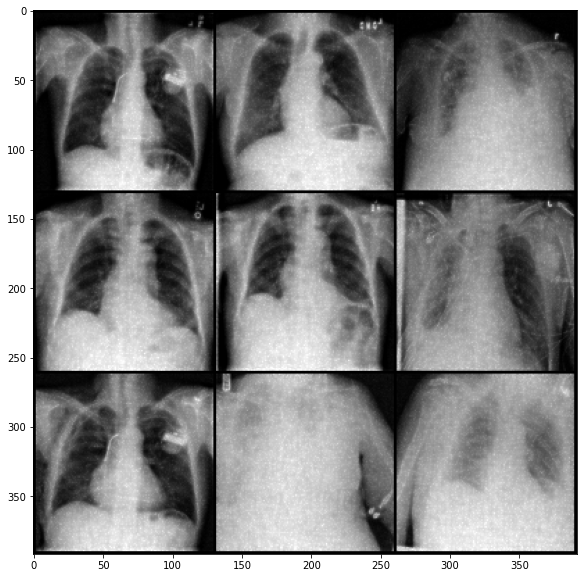

avg_d_loss 0.7039466940265862
avg_g_loss 1.8281862023773232
PSNR:  31.146249738312967
SSIM:  0.8302301168441772
Epoch Number: 13


  0%|          | 0/20 [00:00<?, ?it/s]

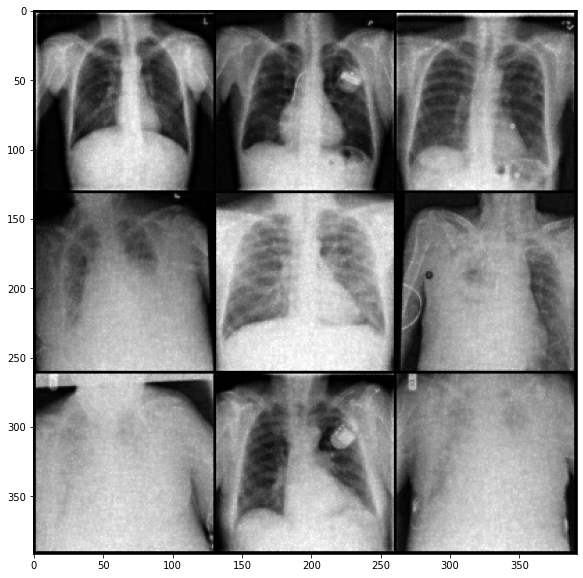

avg_d_loss 0.7026597017226032
avg_g_loss 1.78150679969325
PSNR:  31.23451079750125
SSIM:  0.824760913848877
Epoch Number: 14


  0%|          | 0/20 [00:00<?, ?it/s]

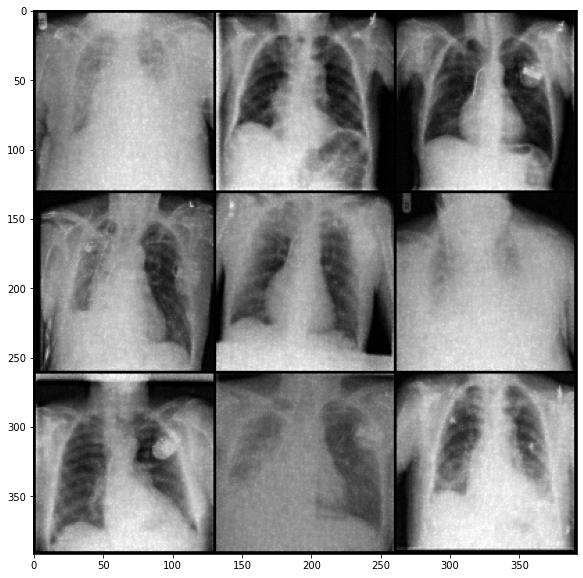

avg_d_loss 0.7011502338317206
avg_g_loss 1.7424708117147598
PSNR:  31.681889034744017
SSIM:  0.8399554491043091
Epoch Number: 15


  0%|          | 0/20 [00:00<?, ?it/s]

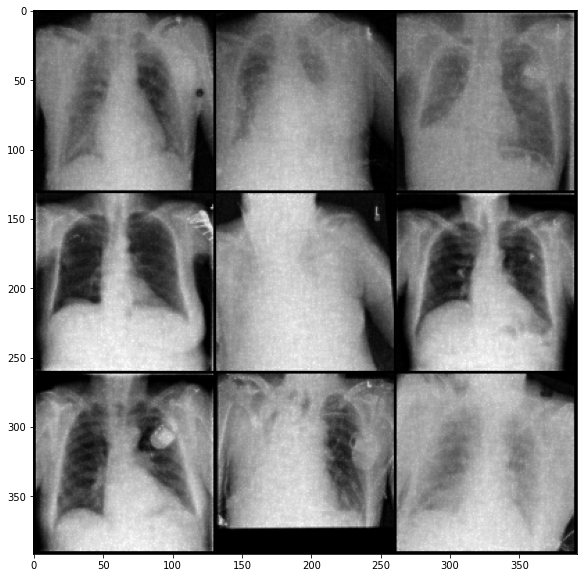

avg_d_loss 0.6999943400723322
avg_g_loss 1.7065715608762617
PSNR:  31.628979537190666
SSIM:  0.8300610780715942
Epoch Number: 16


  0%|          | 0/20 [00:00<?, ?it/s]

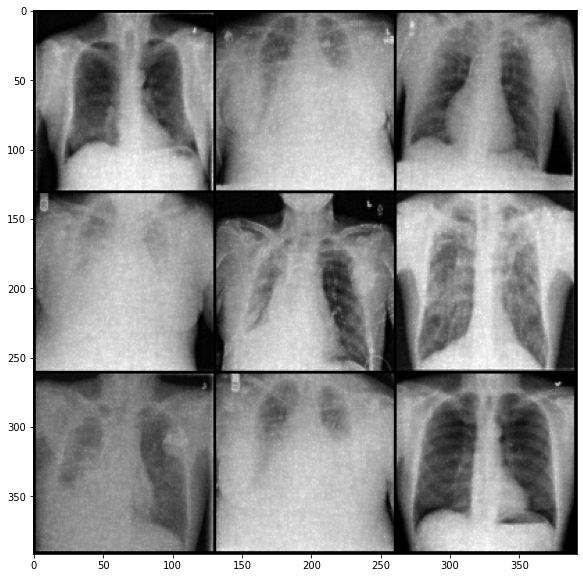

avg_d_loss 0.6991248769814967
avg_g_loss 1.6781117368949168
PSNR:  31.812314962497794
SSIM:  0.8307223320007324
Epoch Number: 17


  0%|          | 0/20 [00:00<?, ?it/s]

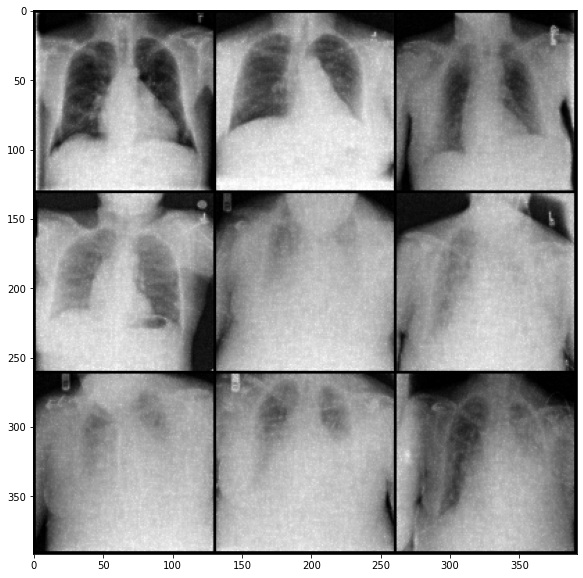

avg_d_loss 0.6983548634263694
avg_g_loss 1.649786223718964
PSNR:  31.963736505129138
SSIM:  0.8065481185913086
Epoch Number: 18


  0%|          | 0/20 [00:00<?, ?it/s]

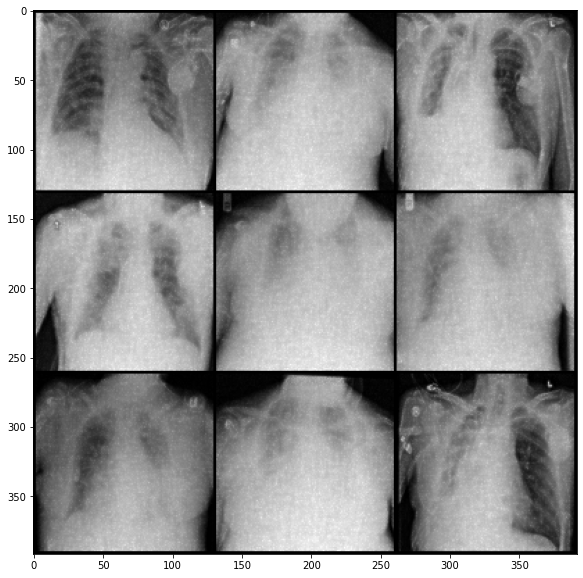

avg_d_loss 0.6975191323838233
avg_g_loss 1.630655446227832
PSNR:  32.160891254352464
SSIM:  0.8189538717269897
Epoch Number: 19


  0%|          | 0/20 [00:00<?, ?it/s]

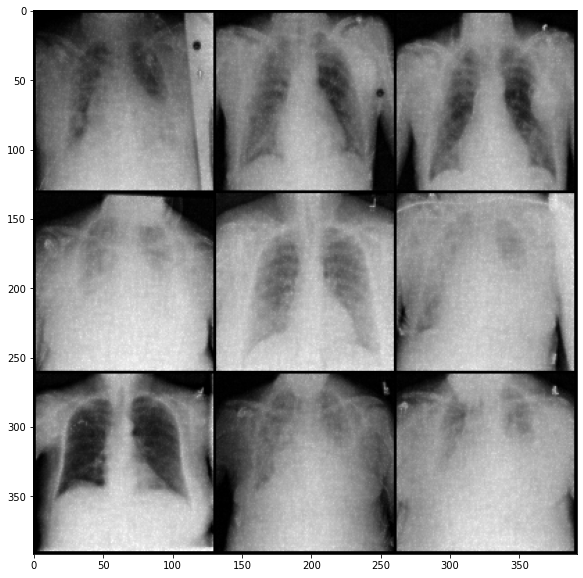

avg_d_loss 0.6969415783909502
avg_g_loss 1.617661612616922
PSNR:  32.64528810951447
SSIM:  0.8341576457023621
Epoch Number: 20


  0%|          | 0/20 [00:00<?, ?it/s]

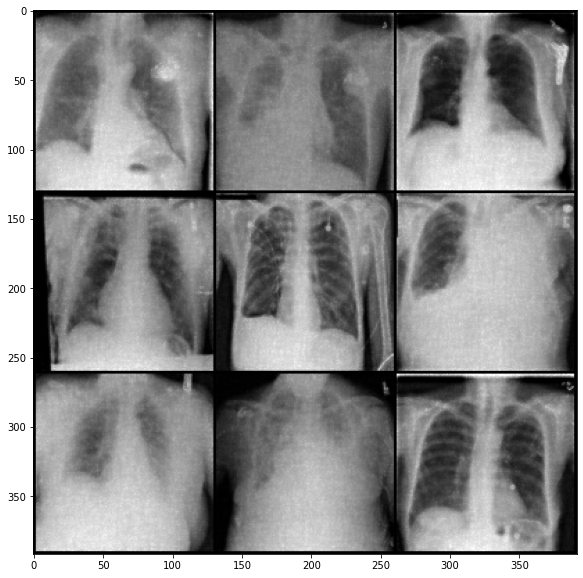

avg_d_loss 0.69639165587343
avg_g_loss 1.587989053651218
PSNR:  32.2062762168538
SSIM:  0.8558558225631714
Epoch Number: 21


  0%|          | 0/20 [00:00<?, ?it/s]

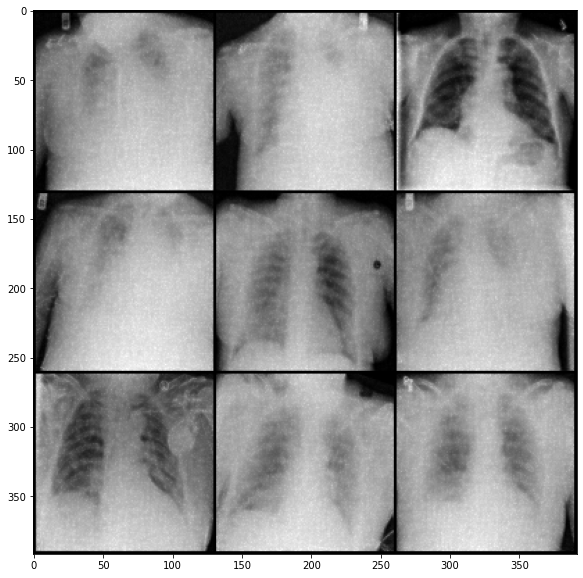

avg_d_loss 0.696024606104889
avg_g_loss 1.5830239426489572
PSNR:  32.29905954101837
SSIM:  0.8102619051933289
Epoch Number: 22


  0%|          | 0/20 [00:00<?, ?it/s]

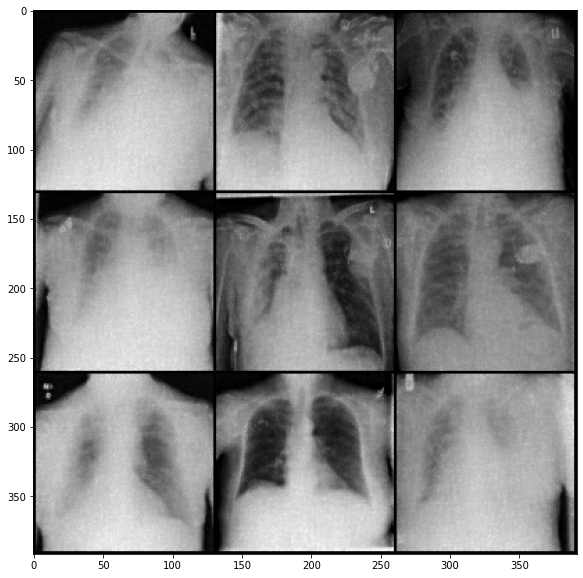

avg_d_loss 0.6955637862024151
avg_g_loss 1.5620161656090885
PSNR:  32.69765731172521
SSIM:  0.8422937393188477
Epoch Number: 23


  0%|          | 0/20 [00:00<?, ?it/s]

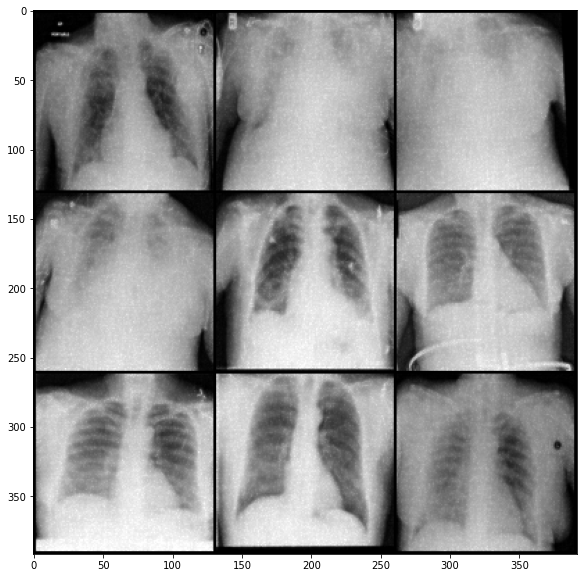

avg_d_loss 0.6953023513094558
avg_g_loss 1.5419935669375673
PSNR:  32.217196339214524
SSIM:  0.8433984518051147
Epoch Number: 24


  0%|          | 0/20 [00:00<?, ?it/s]

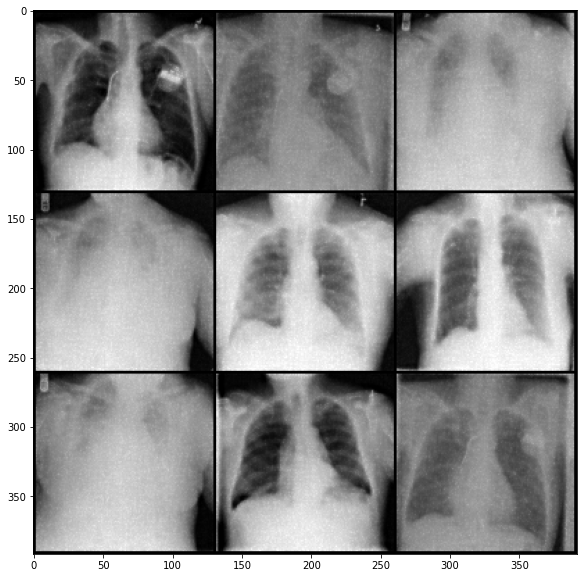

avg_d_loss 0.6949928909259688
avg_g_loss 1.531630263122343
PSNR:  32.737747631615726
SSIM:  0.8563746213912964
Epoch Number: 25


  0%|          | 0/20 [00:00<?, ?it/s]

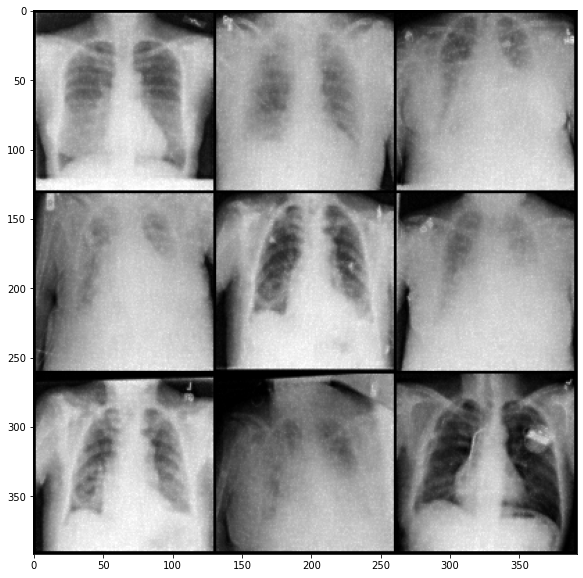

avg_d_loss 0.6947800395402779
avg_g_loss 1.5362412086775872
PSNR:  32.506031960647306
SSIM:  0.8583589792251587
Epoch Number: 26


  0%|          | 0/20 [00:00<?, ?it/s]

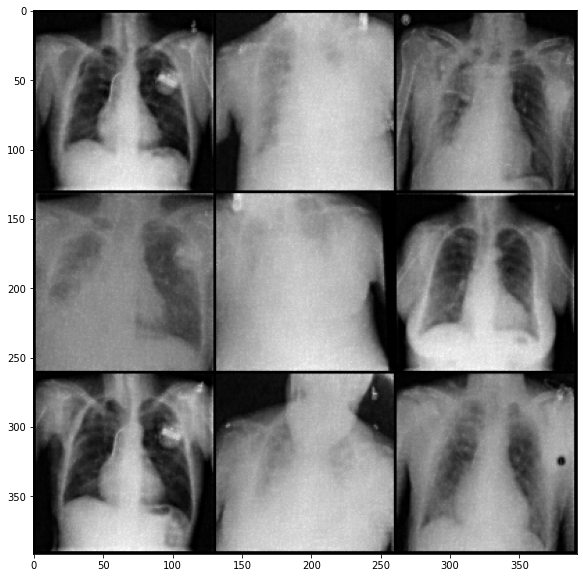

avg_d_loss 0.6945308721785948
avg_g_loss 1.5146311186183858
PSNR:  32.860595969199316
SSIM:  0.8627691268920898
Epoch Number: 27


  0%|          | 0/20 [00:00<?, ?it/s]

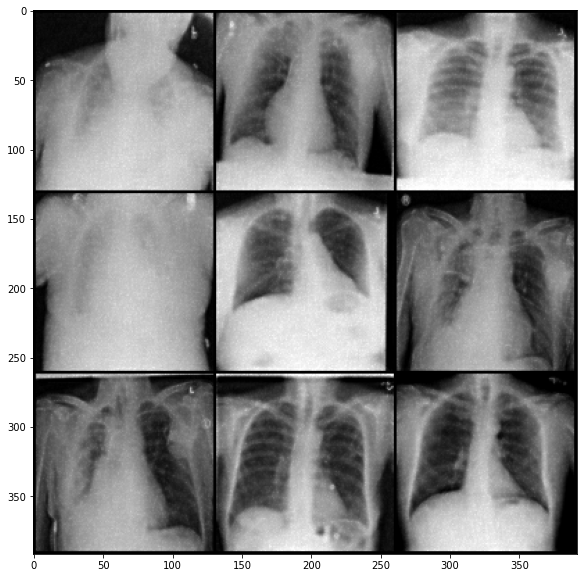

avg_d_loss 0.6943439405086871
avg_g_loss 1.5094856446232812
PSNR:  32.66640653097297
SSIM:  0.8660658001899719
Epoch Number: 28


  0%|          | 0/20 [00:00<?, ?it/s]

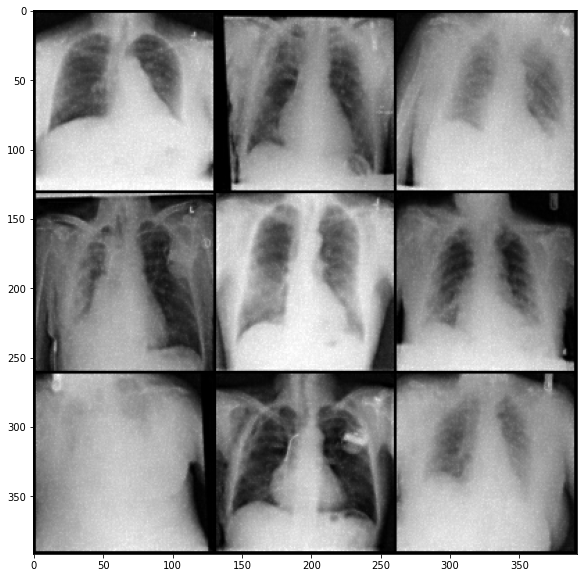

avg_d_loss 0.6941742137109221
avg_g_loss 1.497342051856736
PSNR:  32.91682362138317
SSIM:  0.8670587539672852
Epoch Number: 29


  0%|          | 0/20 [00:00<?, ?it/s]

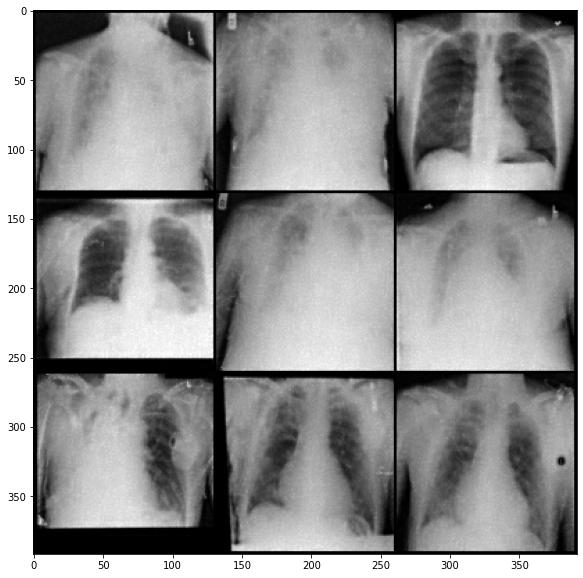

avg_d_loss 0.6940772665639688
avg_g_loss 1.4937507266384151
PSNR:  32.869126162960534
SSIM:  0.8614441156387329
Epoch Number: 30


  0%|          | 0/20 [00:00<?, ?it/s]

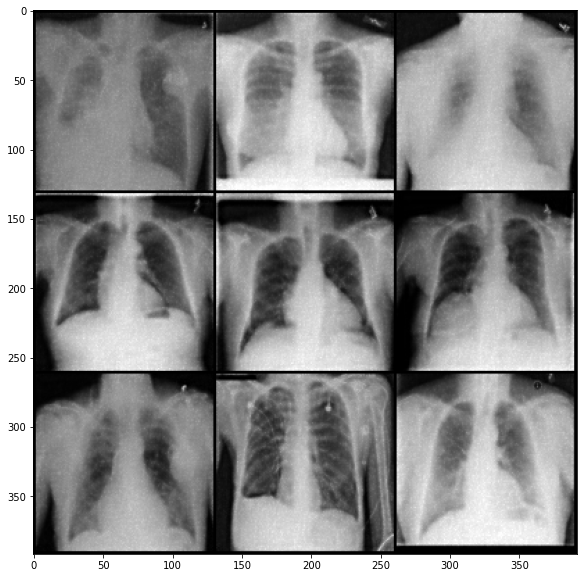

avg_d_loss 0.693968930677151
avg_g_loss 1.4903555746840693
PSNR:  32.55024105078064
SSIM:  0.8782899975776672
Epoch Number: 31


  0%|          | 0/20 [00:00<?, ?it/s]

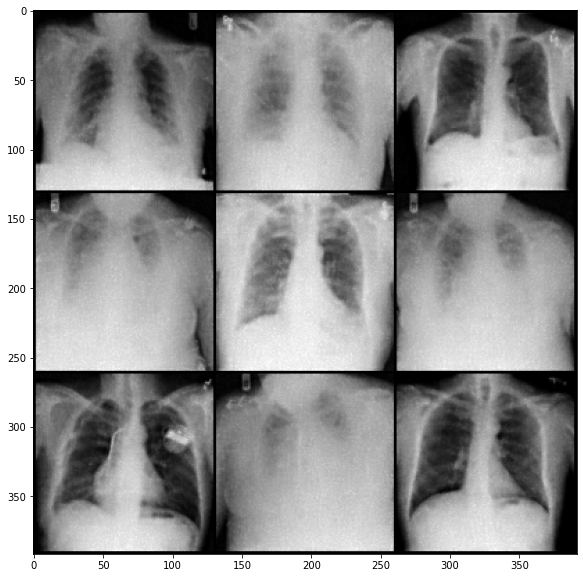

avg_d_loss 0.6938464726585404
avg_g_loss 1.4809776455386605
PSNR:  33.209569059293926
SSIM:  0.8612165451049805
Epoch Number: 32


  0%|          | 0/20 [00:00<?, ?it/s]

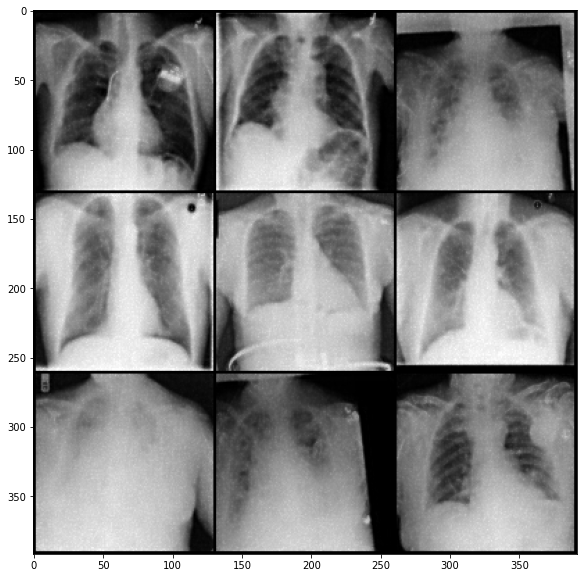

avg_d_loss 0.6938094844318274
avg_g_loss 1.4690379726351408
PSNR:  32.77754262198755
SSIM:  0.8715001940727234
Epoch Number: 33


  0%|          | 0/20 [00:00<?, ?it/s]

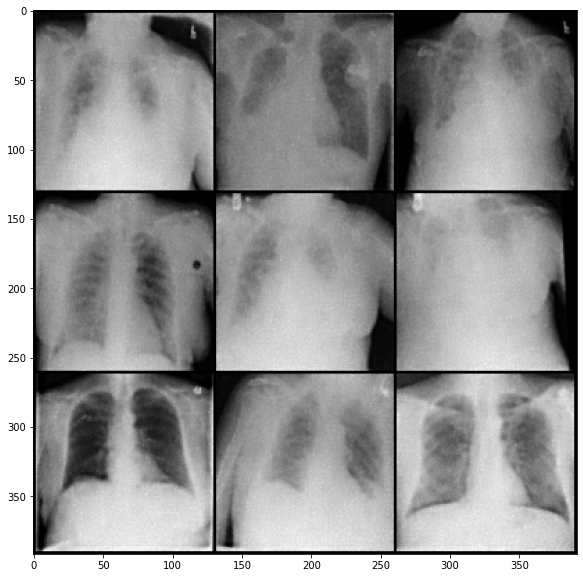

avg_d_loss 0.6936896363960032
avg_g_loss 1.4695620567048537
PSNR:  33.671544525151376
SSIM:  0.8596561551094055
Epoch Number: 34


  0%|          | 0/20 [00:00<?, ?it/s]

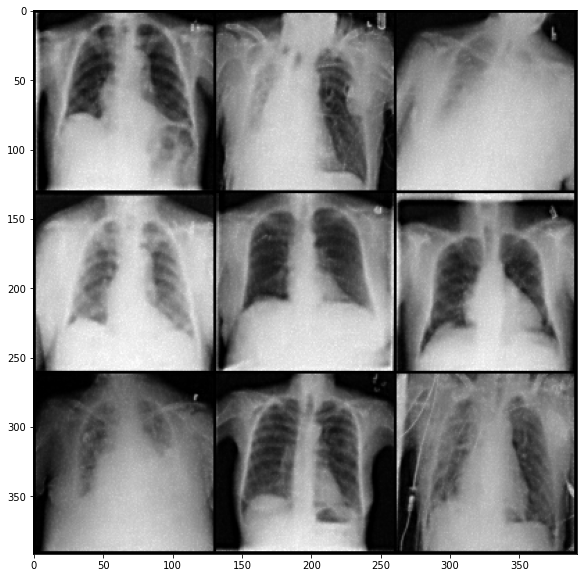

avg_d_loss 0.6936185965075895
avg_g_loss 1.4581217843311636
PSNR:  32.86105696463778
SSIM:  0.884097695350647
Epoch Number: 35


  0%|          | 0/20 [00:00<?, ?it/s]

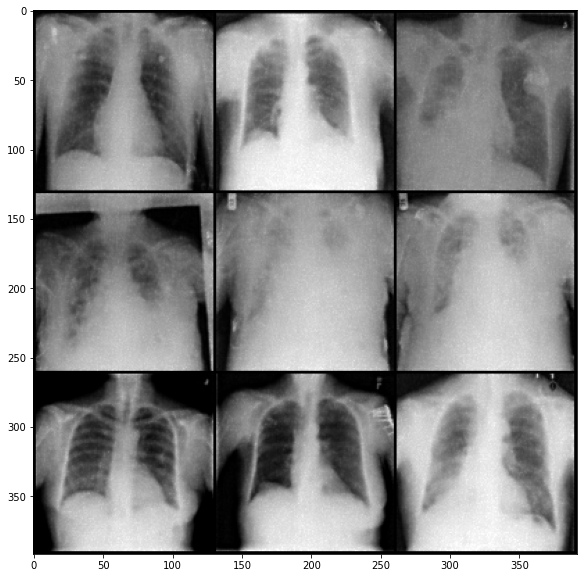

avg_d_loss 0.6935331174174897
avg_g_loss 1.4585468400862311
PSNR:  33.14213458474691
SSIM:  0.8716710209846497
Epoch Number: 36


  0%|          | 0/20 [00:00<?, ?it/s]

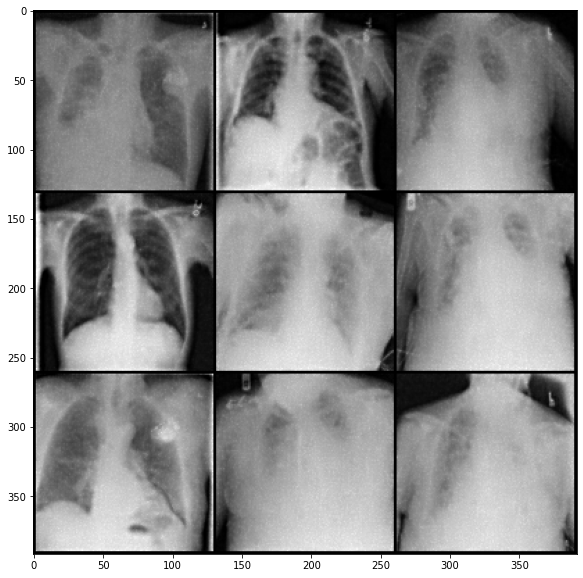

avg_d_loss 0.6935453994127648
avg_g_loss 1.4461461561625542
PSNR:  33.31671296798896
SSIM:  0.86797034740448
Epoch Number: 37


  0%|          | 0/20 [00:00<?, ?it/s]

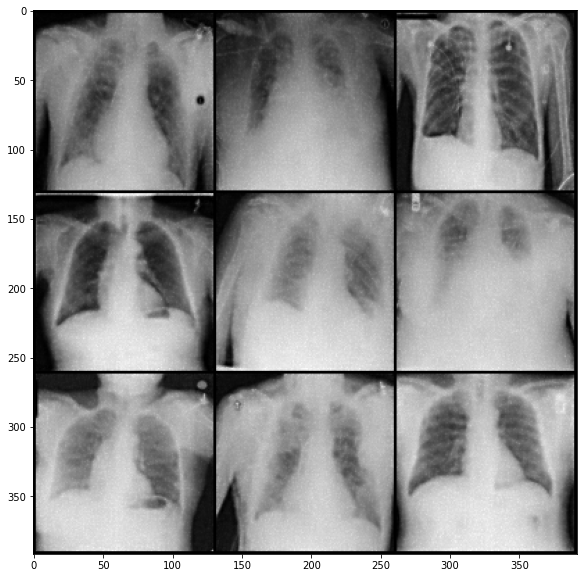

avg_d_loss 0.6934678530077107
avg_g_loss 1.4398316358901249
PSNR:  33.20804696442565
SSIM:  0.8729181289672852
Epoch Number: 38


  0%|          | 0/20 [00:00<?, ?it/s]

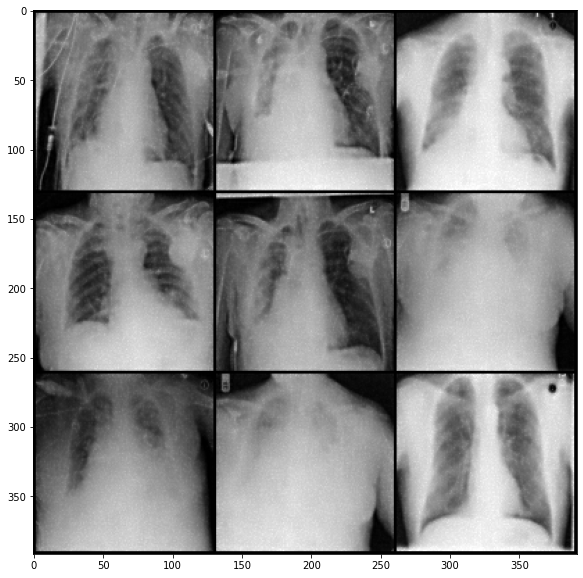

avg_d_loss 0.6934224801121808
avg_g_loss 1.4344797882058682
PSNR:  32.94327030160966
SSIM:  0.870681881904602
Epoch Number: 39


  0%|          | 0/20 [00:00<?, ?it/s]

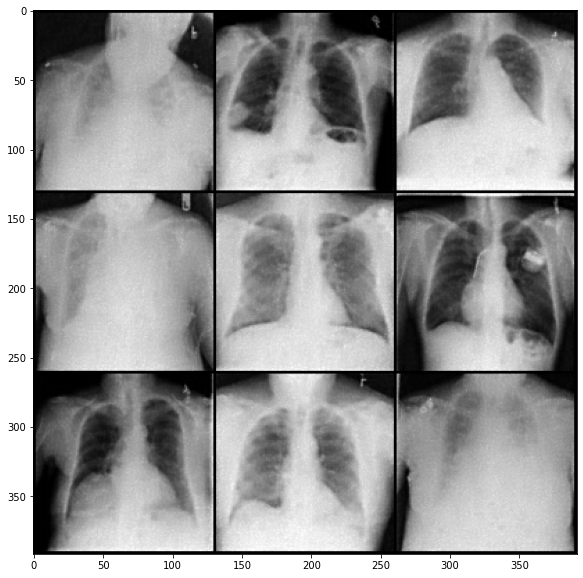

avg_d_loss 0.693363907979832
avg_g_loss 1.4311869638093886
PSNR:  33.29050723049363
SSIM:  0.8767984509468079
Epoch Number: 40


  0%|          | 0/20 [00:00<?, ?it/s]

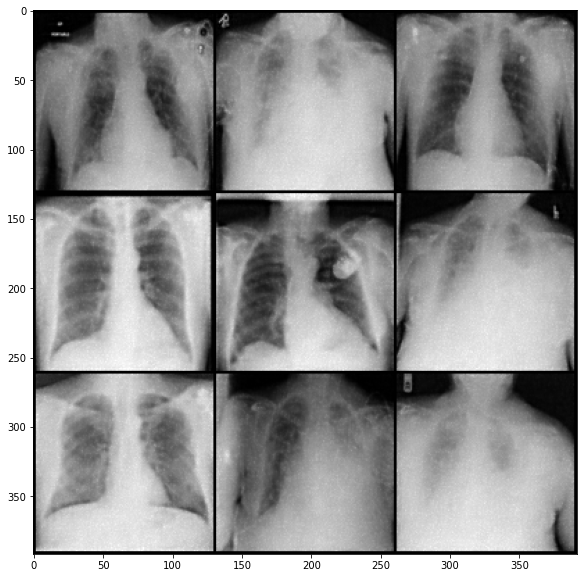

avg_d_loss 0.6933500575846236
avg_g_loss 1.423316538096052
PSNR:  33.177093355210914
SSIM:  0.8717409372329712
Epoch Number: 41


  0%|          | 0/20 [00:00<?, ?it/s]

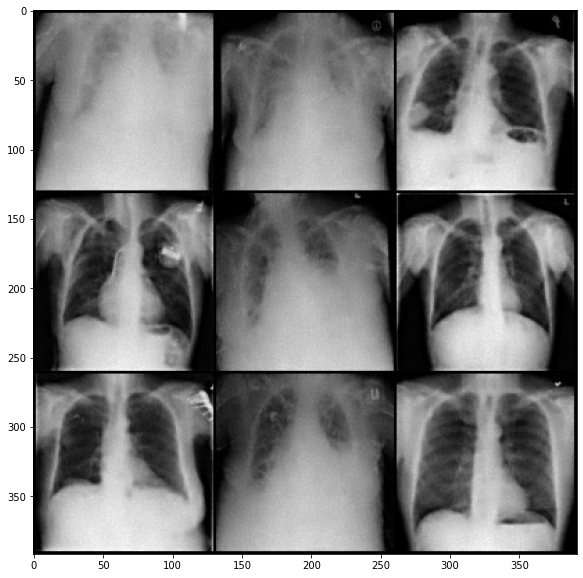

avg_d_loss 0.6933047999397874
avg_g_loss 1.4172628332156418
PSNR:  33.60977487115532
SSIM:  0.8872516751289368
Epoch Number: 42


  0%|          | 0/20 [00:00<?, ?it/s]

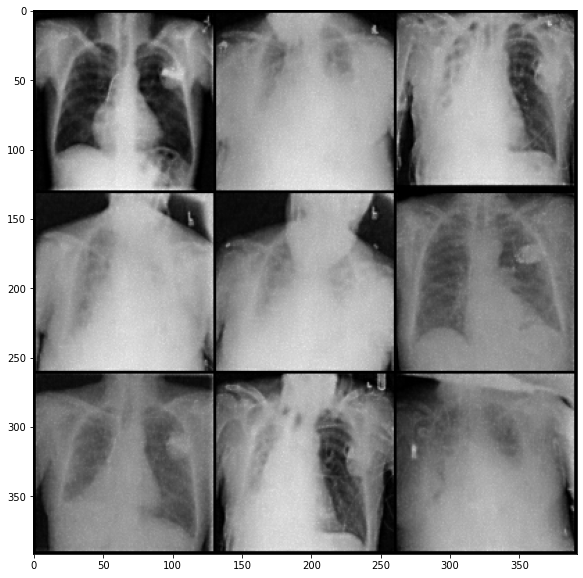

avg_d_loss 0.6931859110358594
avg_g_loss 1.4125329534975766
PSNR:  33.27163845596392
SSIM:  0.8726713061332703
Epoch Number: 43


  0%|          | 0/20 [00:00<?, ?it/s]

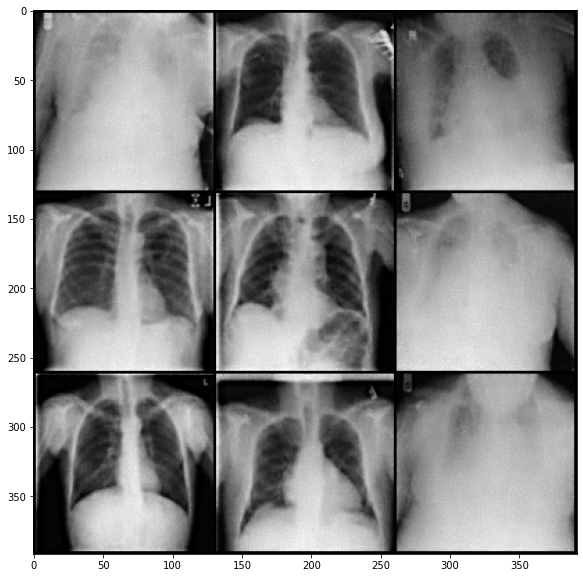

avg_d_loss 0.6931775707146323
avg_g_loss 1.4047008640761531
PSNR:  33.83474622906874
SSIM:  0.8954067230224609
Epoch Number: 44


  0%|          | 0/20 [00:00<?, ?it/s]

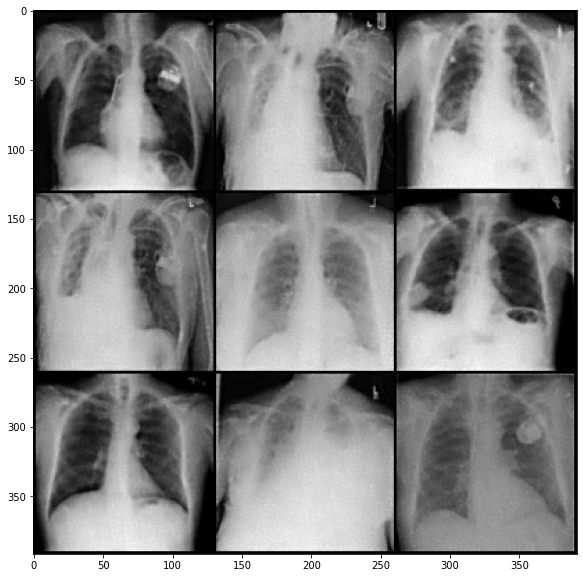

avg_d_loss 0.6930919286658026
avg_g_loss 1.403371964301974
PSNR:  33.180585059598116
SSIM:  0.8843967318534851
Epoch Number: 45


  0%|          | 0/20 [00:00<?, ?it/s]

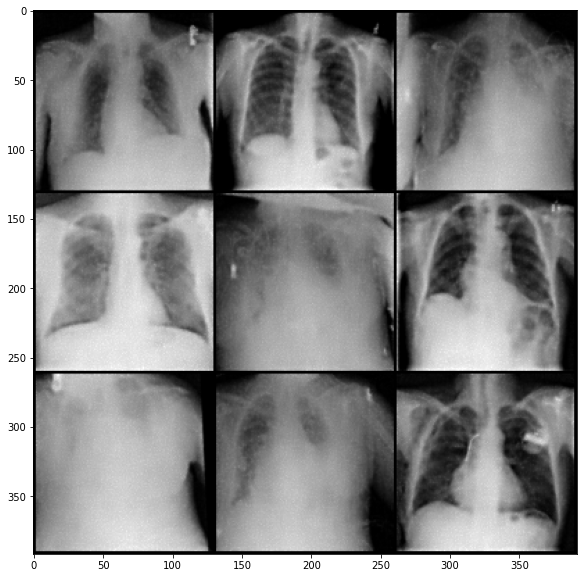

avg_d_loss 0.6930240077811698
avg_g_loss 1.3963072171084012
PSNR:  33.44722756448744
SSIM:  0.8891498446464539
Epoch Number: 46


  0%|          | 0/20 [00:00<?, ?it/s]

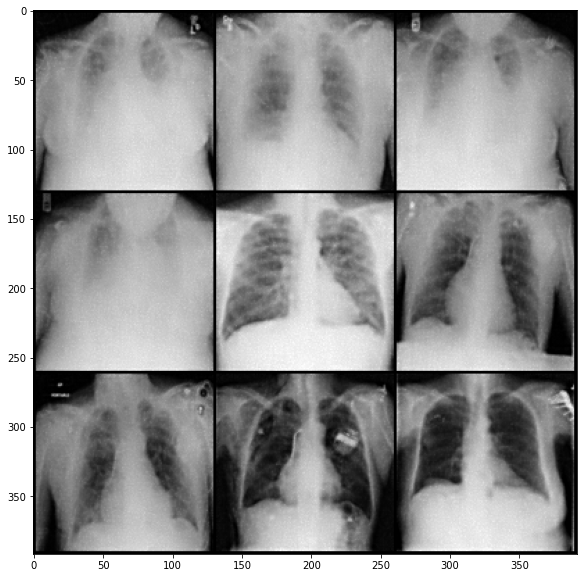

avg_d_loss 0.692748050973711
avg_g_loss 1.381396090975819
PSNR:  33.570034053001805
SSIM:  0.8809992671012878
Epoch Number: 47


  0%|          | 0/20 [00:00<?, ?it/s]

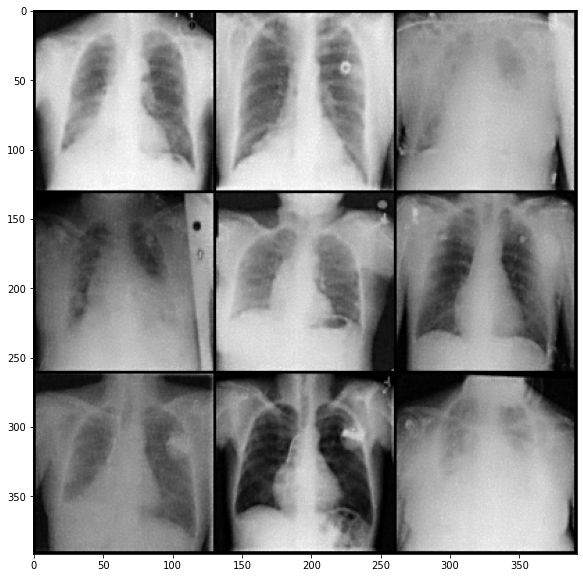

avg_d_loss 0.6926764537552145
avg_g_loss 1.3750782091051101
PSNR:  33.73262919498757
SSIM:  0.8849562406539917
Epoch Number: 48


  0%|          | 0/20 [00:00<?, ?it/s]

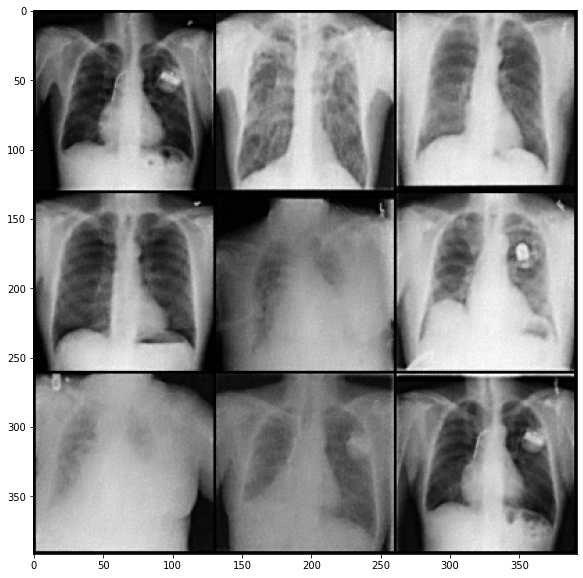

avg_d_loss 0.692713450641645
avg_g_loss 1.3774646936321713
PSNR:  33.314852464876594
SSIM:  0.9008839726448059
Epoch Number: 49


  0%|          | 0/20 [00:00<?, ?it/s]

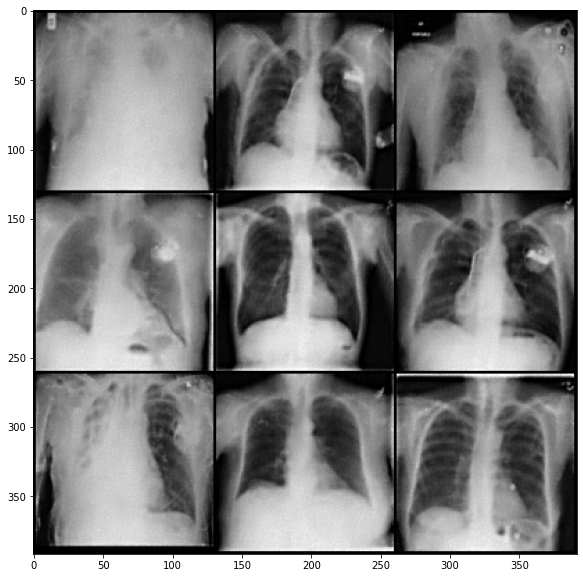

avg_d_loss 0.6925874993712623
avg_g_loss 1.3664727023811674
PSNR:  33.140707029281714
SSIM:  0.9009912610054016
Epoch Number: 50


  0%|          | 0/20 [00:00<?, ?it/s]

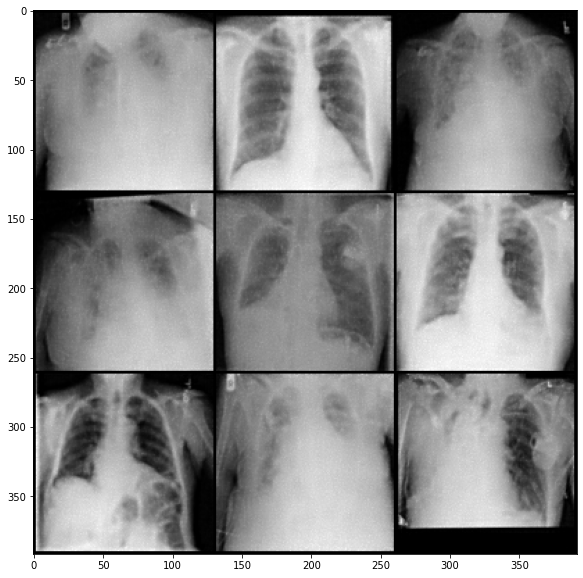

avg_d_loss 0.6923487684613981
avg_g_loss 1.3569753886990472
PSNR:  33.49525215378576
SSIM:  0.8859950304031372


In [ ]:
# Training loop

for i in range(epochs):
  it = i+1
  print('Epoch Number:', it)
  total_d_loss = 0.0
  total_g_loss = 0.0
  for images in tqdm(a_loader):
    
    real_image = images[:,0]
    real_image = real_image.to(device)
    noisy_image = images[:,1]
    noisy_image = noisy_image.to(device)

    D_opt.zero_grad()

    fake_image = G(noisy_image) 
    D_fake_image = D(fake_image)
    fake_image_loss = fake_loss(D_fake_image)

    D_real_image = D(real_image) 
    real_image_loss = real_loss(D_real_image)

    D_loss = (real_image_loss + fake_image_loss)/2 
    total_d_loss += D_loss.item()

    D_loss.backward() 
    # this calculate backwards for alllllll involved params. 
    # but the D_opt decides which to update.
    # so the graph for all params including G have been traversed
    # therefore need to create a new graph with all the params from scratch

    D_opt.step()

    #G loss
    G_opt.zero_grad()

    fake_image = G(noisy_image) 
    D_fake_image = D(fake_image)
    G_loss = real_loss(D_fake_image) + 0.01*pixel_loss(real_image, fake_image)
    
    # G_loss = - fake_loss(D_fake_image) 
    
    total_g_loss += G_loss.item()
    G_loss.backward()
    G_opt.step()

  # Display Output
  show_tensor_images(fake_image)

  # Calculating Loss
  avg_d_loss = total_d_loss/len(a_loader)
  avg_g_loss = total_g_loss/len(a_loader)
  print('avg_d_loss', avg_d_loss)
  print('avg_g_loss', avg_g_loss)
  # Calculating PSNR and SSIM
  psn = calculate_batch_psnr(fake_image, real_image)
  ssm = calculate_batch_ssim(fake_image, real_image)
  print('PSNR: ', psn.tolist())
  print("SSIM: ", ssm.tolist())
  
  # Appending losses and evaluations to the list
  iter.append(it)
  psnr.append(psn.tolist())
  ssim.append(ssm.tolist())
  dloss.append(avg_d_loss)
  gloss.append(avg_g_loss)

  # Saving the model
  torch.save({
          'Disc': D.state_dict(),
          'Gen': G.state_dict(),
          'Disc_opt': D_opt.state_dict(),
          'Gen_opt': G_opt.state_dict(),
          }, f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_models_it_{it}.pth')
  #files.download(f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_models_it_{it}.pth')

  torch.save(D, f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_disc_it_{it}.pth')
  #files.download(f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_disc_it_{it}.pth')

  torch.save(G, f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_gen_it_{it}.pth')
  #files.download(f'/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_gen_it_{it}.pth')

In [ ]:
iter_psnr["Iterations"] = iter
iter_psnr["PSNR"] = psnr
iter_psnr["D_Loss"] = dloss 
iter_psnr["G_Loss"] = gloss
iter_psnr["SSIM"] = ssim

Text(0.5, 0.98, 'ITERATIONS vs PSNR')

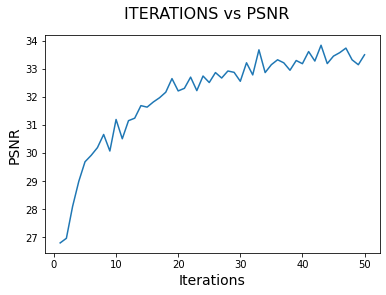

In [ ]:
# Plot for Iterations vs PSNR
plt.plot(iter_psnr["Iterations"], iter_psnr["PSNR"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('PSNR', fontsize=14)
plt.suptitle('ITERATIONS vs PSNR', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs SSIM')

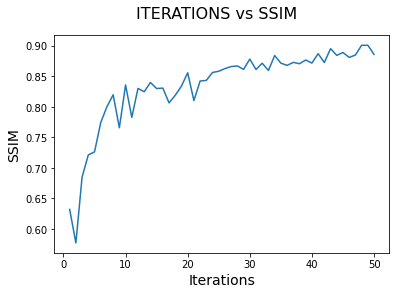

In [ ]:
# Plot for Iterations vs SSIM
plt.plot(iter_psnr["Iterations"], iter_psnr["SSIM"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('SSIM', fontsize=14)
plt.suptitle('ITERATIONS vs SSIM', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs D_LOSS')

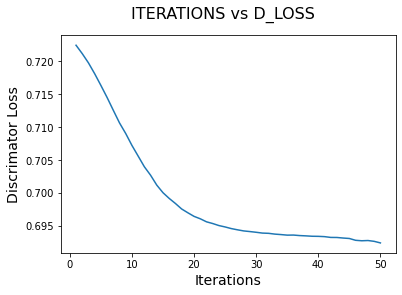

In [ ]:
# Plot for Iterations vs Discriminator Loss
plt.plot(iter_psnr["Iterations"], iter_psnr["D_Loss"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('Discrimator Loss', fontsize=14)
plt.suptitle('ITERATIONS vs D_LOSS', fontsize=16)

Text(0.5, 0.98, 'ITERATIONS vs G_Loss')

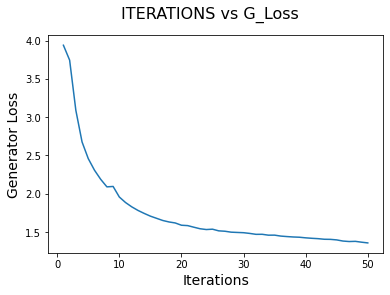

In [ ]:
# Plot for Iterations vs Generator Loss
plt.plot(iter_psnr["Iterations"], iter_psnr["G_Loss"])
plt.xlabel('Iterations', fontsize=14)
plt.ylabel('Generator Loss', fontsize=14)
plt.suptitle('ITERATIONS vs G_Loss', fontsize=16)

In [ ]:
# Saving the iter_psnr dataframe
iter_psnr.to_csv("/content/drive/MyDrive/Denoising_GANs/poisson_final_metrics.csv")

In [ ]:
denoiser = Generator()
#poisson_denoiser = Generator()

optimDenoiser= torch.optim.Adam(denoiser.parameters(), lr=0.0002,betas=(0.5, 0.99) )
#optimPoisson = torch.optim.Adam(denoiser.parameters(), lr=0.001,betas=(0.5, 0.99) )

checkpoint = torch.load("/content/drive/MyDrive/Denoising_GANs/poisson/checkpoint_models_it_50.pth")
denoiser.load_state_dict(checkpoint["Gen"])
optimDenoiser.load_state_dict(checkpoint['Gen_opt'])
denoiser.to(device)
denoiser.eval()


Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
denoiser.double()

Generator(
  (block1): Sequential(
    (0): Conv2d(1, 16, kernel_size=(9, 9), stride=(1, 1), padding=same)
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block2): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block3): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (block4): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): PReLU(num_parameters=1)
  )
  (blockResConv): Sequential(
    (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), paddi

In [ ]:
test_img = Image.open('/content/drive/MyDrive/Denoising_GANs/images/00013774_026.png')

In [ ]:
test_img = reduce_size(test_img)
test_img.min(   )
test_img.shape

(1, 128, 128)

In [ ]:
test_img_noisy = noisy("poisson", test_img)
test_img_noisy = test_img_noisy.reshape(1,1,128,128)

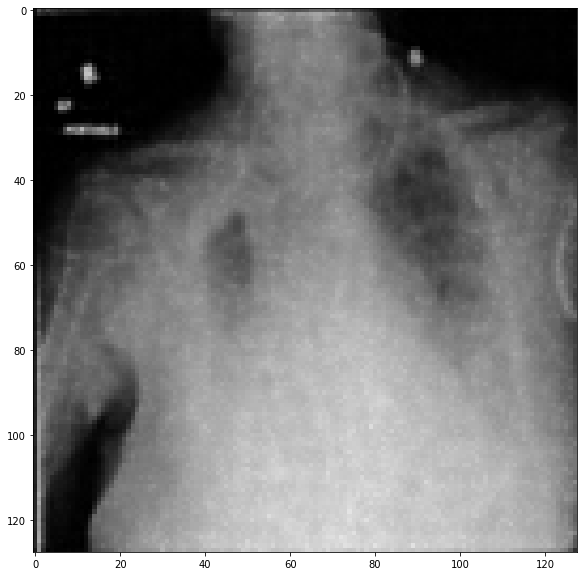

In [ ]:
# Run after training is completed.
# Now you can use Generator Network to generate handwritten images
noisy_image = torch.tensor(test_img_noisy)
#images[:,1]
noisy_image = noisy_image.to(device)
#noise = torch.randn(batch_size, noisy_image, device = device)
#generated_image = gen(noisy_image)
remove_photon = denoiser(noisy_image)
show_tensor_images(remove_photon)

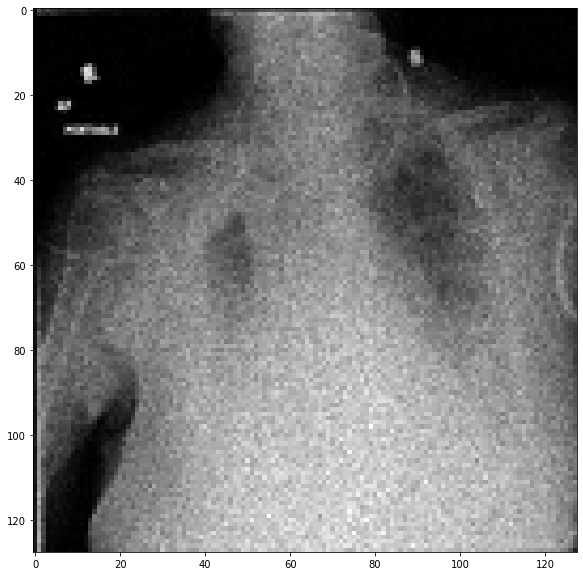

In [ ]:
show_tensor_images(noisy_image)

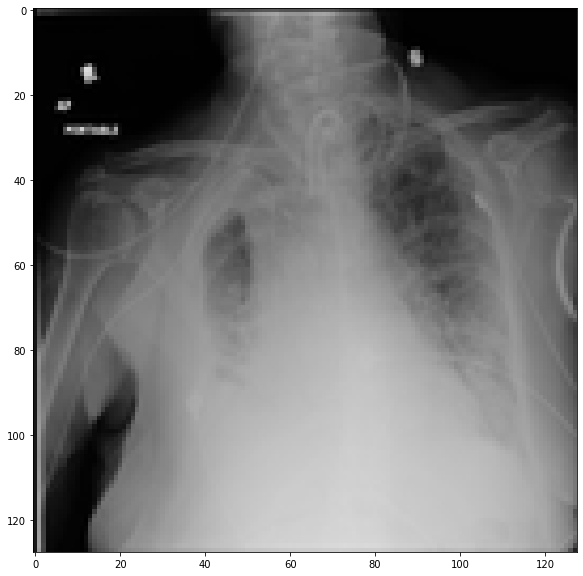

In [ ]:
orig = torch.tensor(test_img)
show_tensor_images(orig)